# Initial Tests

In [1]:
import os
import sys
print(sys.version)
sys.path.extend(['./COMMON_UTILS/'])

3.9.10 (main, Mar 17 2022, 21:35:59) 
[GCC 11.2.0]


In [2]:
import pickle as pkl

import numpy as np
from scipy.interpolate import interp1d
import matplotlib.pyplot as plt

import torch
import librosa

from IPython.display import display, Audio

In [3]:
from drum_processor import getDownbeats
from drum_decomposition import getDecomposition, plotDecomposition, isolateSources

In [4]:
plt.rcParams['figure.figsize'] = (15, 5)

In [5]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'computing on {device}')

computing on cuda


## Load Audio

In [136]:
SRC = './PROCESSED/dem_bow'
# DST = './PROCESSED/neil_young'
DST = './PROCESSED/stereofuse_casino_04'

# DST = './PROCESSED/stereofuse_casino_04'
# SRC = './PROCESSED/astrud_gilberto'

In [137]:
y_src, sr = librosa.load(os.path.join(SRC, 'DRUMS/drums.wav'))
y_dst, _ = librosa.load(os.path.join(DST, 'DRUMS/drums.wav'), sr=sr)
y_dst_full, _ = librosa.load(os.path.join(DST, 'source.wav'), sr=sr)

In [138]:
stems = []
for s in ['vocals', 'bass', 'other']:
    y_ins, _ = librosa.load(os.path.join(DST, s.upper(), f'{s}.wav'), sr=sr)
    stems.append(y_ins)
y_dst_ins = np.sum(stems, axis=0)

In [139]:
display(Audio(y_dst_ins, rate=sr))

In [142]:
tempo_src = librosa.beat.tempo(y=y_src, sr=sr)
tempo_dst = librosa.beat.tempo(y=y_dst, sr=sr)
print(tempo_src, tempo_dst)

[99.38401442] [129.19921875]


In [146]:
db_src = getDownbeats(
    os.path.join(SRC, 'source.wav'), 
    transition_lambda=32, 
    min_bpm=tempo_src*0.8,
    max_bpm=tempo_src*1.2
)

/home/arran/.pyenv/versions/3.9.10/lib/python3.9/site-packages/madmom/features/downbeats.py:287: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  best = np.argmax(np.asarray(results)[:, 1])


In [147]:
db_dst = getDownbeats(
    os.path.join(DST, 'source.wav'), 
    transition_lambda=32, 
    min_bpm=tempo_dst*0.8, 
    max_bpm=tempo_dst*1.2
)

In [148]:
display(Audio(y_src, rate=sr))
display(Audio(y_dst, rate=sr))

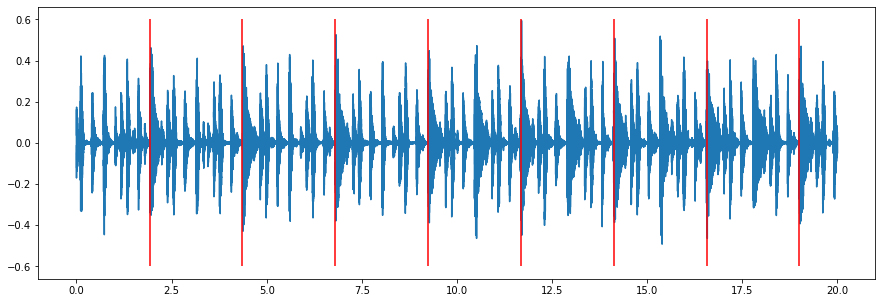

In [149]:
plt.plot(librosa.samples_to_time(np.arange(len(y_src))), y_src)
plt.vlines(db_src, -0.6, 0.6, color='red');

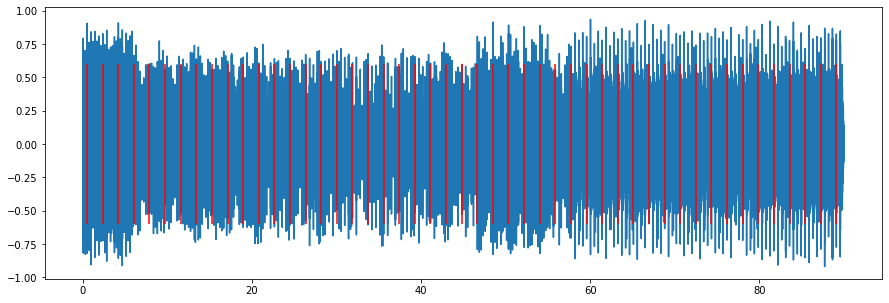

In [150]:
plt.plot(librosa.samples_to_time(np.arange(len(y_dst))), y_dst)
plt.vlines(db_dst, -0.6, 0.6, color='red');

## Align Downbeats 

In [151]:
num_bars = min(len(db_dst), len(db_src))

In [152]:
idxs_src = librosa.time_to_samples((db_src[0], db_src[num_bars-1]), sr=sr)

In [153]:
mapping = interp1d(
    x=np.linspace(0, 1, idxs_src[1]-idxs_src[0]),
    y=y_src[idxs_src[0]:idxs_src[1]],
    assume_sorted=True
)

In [154]:
idxs_dst = librosa.time_to_samples((db_dst[0], db_dst[num_bars-1]), sr=sr)

In [155]:
y_src_warped = mapping(np.linspace(0, 1, idxs_dst[1] - idxs_dst[0]))

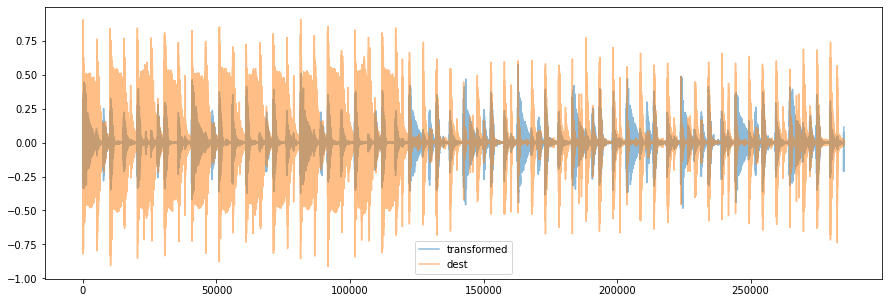

In [156]:
plt.plot(y_src_warped, label='transformed', alpha=0.5)
plt.plot(y_dst[idxs_dst[0]:idxs_dst[1]], label='dest', alpha=0.5)
plt.legend();

In [157]:
display(Audio(y_src_warped + y_dst[idxs_dst[0]:idxs_dst[1]], rate=sr))

In [158]:
y_dst_segment = y_dst[idxs_dst[0]:idxs_dst[1]]
y_ins_segment = y_dst_ins[idxs_dst[0]:idxs_dst[1]]
y_dst_full_segment = y_dst_full[idxs_dst[0]:idxs_dst[1]]

## Decompose Drums 

In [159]:
with open('./drum_templates.pkl', 'rb') as f:
    templates = pkl.load(f)

In [160]:
kd_temp = templates['kd_temp']
sd_temp = templates['sd_temp']
hh_temp = templates['hh_temp']

In [161]:
W_0 = np.stack([kd_temp, sd_temp, hh_temp], axis=1)
W_0 = torch.from_numpy(W_0).to(device)

In [162]:
W_src, H_src, V_src, _, net_src = getDecomposition(y_src_warped, R=3, W=W_0, trainable_W=True)

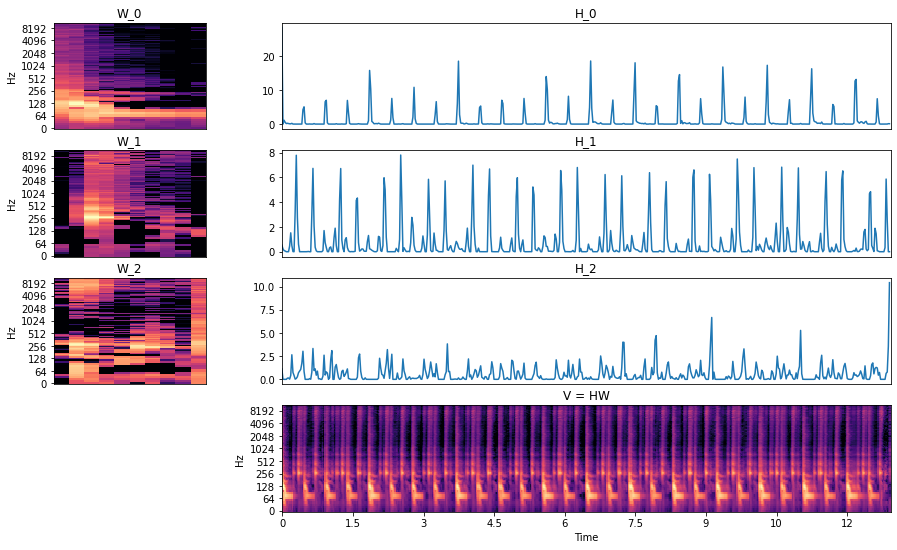

In [163]:
plotDecomposition(W_src, H_src, V_src)

In [164]:
y_s = isolateSources(net_src)

In [165]:
for y in y_s:
    display(Audio(y, rate=sr))

In [166]:
W_dst, H_dst, V_dst, _, net_dst = getDecomposition(y_dst_segment, R=3, W=W_0)

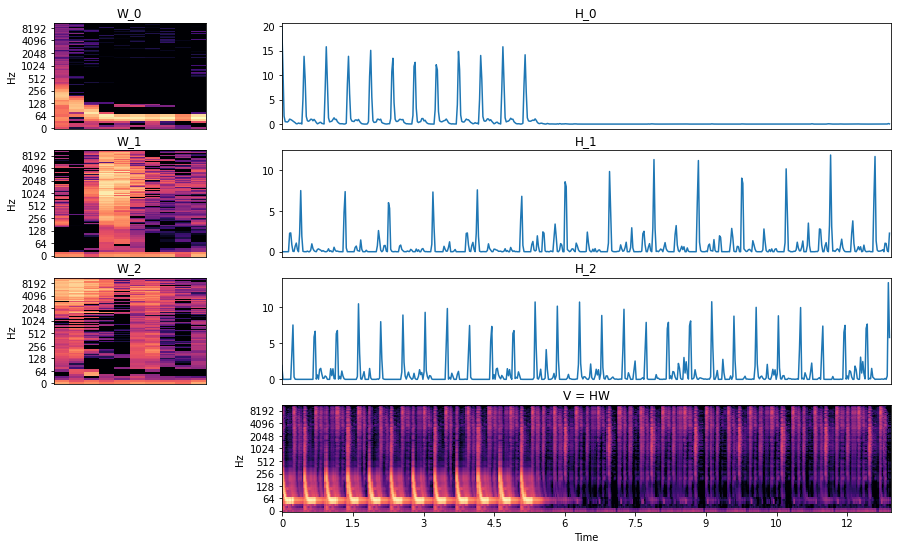

In [167]:
plotDecomposition(W_dst, H_dst, V_dst)

In [168]:
y_d = isolateSources(net_dst)

In [169]:
for y in y_d:
    display(Audio(y, rate=sr))

## Apply New Rhythm 

In [170]:
H_hat = torch.from_numpy(H_src)
for i in range(H_src.shape[0]):
    scale = net_dst.H[0, i].max() / H_src[i].max()
    H_hat[i] *= scale

In [171]:
V_hat = net_dst.reconstruct(net_dst.W, H_hat.unsqueeze(0)).detach().cpu().squeeze().numpy()

In [172]:
y_r = librosa.griffinlim(V_hat)

In [173]:
display(Audio(y_r, rate=sr))

## Combine 

In [174]:
y_final = np.sum([y_r, y_ins_segment[:len(y_r)]], axis=0)

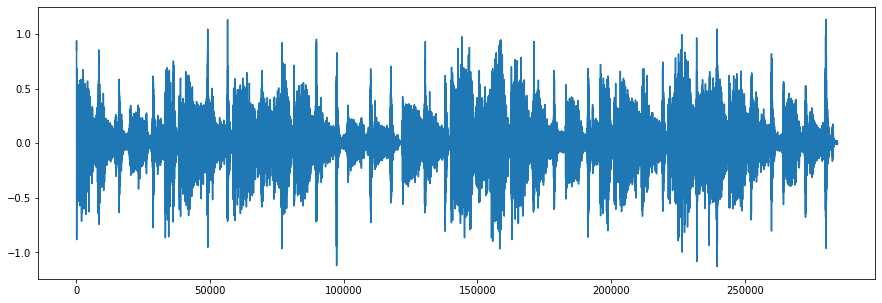

In [175]:
plt.plot(y_final);

In [176]:
print('original')
display(Audio(y_dst_full_segment, rate=sr))
print('transformed')
display(Audio(y_final, rate=sr))

original


transformed


## Next Steps

- Data: audio data from Free Music Archive to collect rhythm data and genre labels
- Improve pipeline robustness
    - fix beat detection
    - detect absent drum elements
    - clean activations
- Learn activation vector transformations
    - Theorise and implement method to (smoothly) interpolate from one rhythm to another in a meaningful way
- Embed rhythm data to map out space of all genres (with respect to rhythm)

In [377]:
with open("activations.pkl", "wb") as f:
    pkl.dump((H_src, H_dst), f)

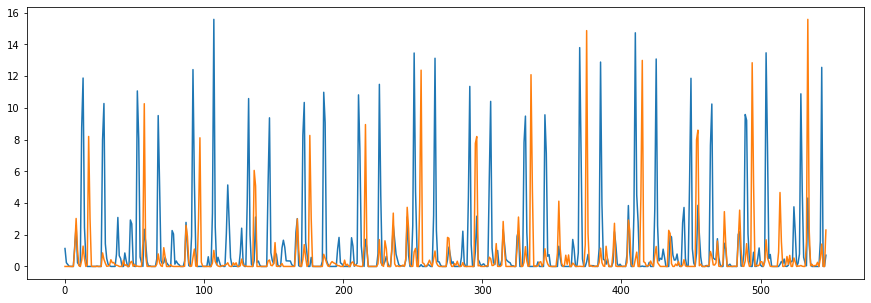

In [382]:
plt.plot(H_src[1])
plt.plot(H_dst[1])